Step1: Import packages

In [2]:
import time, psutil, os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, KFold,  GridSearchCV
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn import metrics
from sklearn.metrics import f1_score
import warnings
warnings.filterwarnings('ignore')
from tensorflow import keras
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

STEP 2:Importing Data 

In [3]:
# from google.colab import drive 
# drive.mount("/content/gdrive", force_remount=True)

In [4]:
df = pd.read_csv('diabetes1.csv')
df

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes
0,1,193,77,49,2.51,19,female,61,119,22.5,118,70,32,38,0.842105,0
1,2,146,79,41,1.85,19,female,60,135,26.4,108,58,33,40,0.825000,0
2,3,217,75,54,2.89,20,female,67,187,29.3,110,72,40,45,0.888889,0
3,4,226,97,70,2.33,20,female,64,114,19.6,122,64,31,39,0.794872,0
4,5,164,91,67,1.80,20,female,70,141,20.2,122,86,32,39,0.820513,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,386,227,105,44,2.16,83,female,59,125,25.2,150,90,35,40,0.875000,0
386,387,226,279,52,0.81,84,female,60,192,37.5,144,88,41,48,0.854167,1
387,388,301,90,118,3.34,89,female,61,115,21.7,218,90,31,41,0.756098,0
388,389,232,184,114,1.26,91,female,61,127,24.0,170,82,35,38,0.921053,1


Step3:Data information

In [5]:
df.dtypes

patient_number       int64
cholesterol          int64
glucose              int64
hdl_chol             int64
chol_hdl_ratio     float64
age                  int64
gender              object
height               int64
weight               int64
bmi                float64
systolic_bp          int64
diastolic_bp         int64
waist                int64
hip                  int64
waist_hip_ratio    float64
diabetes             int64
dtype: object

In [6]:
df.head(5)

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes
0,1,193,77,49,2.51,19,female,61,119,22.5,118,70,32,38,0.842105,0
1,2,146,79,41,1.85,19,female,60,135,26.4,108,58,33,40,0.825000,0
2,3,217,75,54,2.89,20,female,67,187,29.3,110,72,40,45,0.888889,0
3,4,226,97,70,2.33,20,female,64,114,19.6,122,64,31,39,0.794872,0
4,5,164,91,67,1.80,20,female,70,141,20.2,122,86,32,39,0.820513,0


In [7]:
df.columns

Index(['patient_number', 'cholesterol', 'glucose', 'hdl_chol',
       'chol_hdl_ratio', 'age', 'gender', 'height', 'weight', 'bmi',
       'systolic_bp', 'diastolic_bp', 'waist', 'hip', 'waist_hip_ratio',
       'diabetes'],
      dtype='object')

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
patient_number,390.0,195.500000,112.727548,1.000000,98.250000,195.500000,292.750000,390.000000
cholesterol,390.0,207.230769,44.666005,78.000000,179.000000,203.000000,229.000000,443.000000
glucose,390.0,107.338462,53.798188,48.000000,81.000000,90.000000,107.750000,385.000000
hdl_chol,390.0,50.266667,17.279069,12.000000,38.000000,46.000000,59.000000,120.000000
chol_hdl_ratio,390.0,2.187667,0.732801,0.360000,1.752500,2.205000,2.580000,4.670000
age,390.0,46.774359,16.435911,19.000000,34.000000,44.500000,60.000000,92.000000
height,390.0,65.951282,3.918867,52.000000,63.000000,66.000000,69.000000,76.000000
weight,390.0,177.407692,40.407824,99.000000,150.250000,173.000000,200.000000,325.000000
bmi,390.0,28.785897,6.616737,15.200000,24.125000,27.800000,32.275000,55.800000
systolic_bp,390.0,137.133333,22.859528,90.000000,122.000000,136.000000,148.000000,250.000000


In [9]:
df.isna().sum()

patient_number     0
cholesterol        0
glucose            0
hdl_chol           0
chol_hdl_ratio     0
age                0
gender             0
height             0
weight             0
bmi                0
systolic_bp        0
diastolic_bp       0
waist              0
hip                0
waist_hip_ratio    0
diabetes           0
dtype: int64

In [10]:
print(df['diabetes'].nunique())

2


In [11]:
print(df['diabetes'].unique())

[0 1]


In [12]:
# df_new = df['Cath'] [df['Cath'] =="Cad"]  =  1
# df['Cath'] [df['Cath'] =="Normal"]  =  0
# df

In [13]:
df

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes
0,1,193,77,49,2.51,19,female,61,119,22.5,118,70,32,38,0.842105,0
1,2,146,79,41,1.85,19,female,60,135,26.4,108,58,33,40,0.825000,0
2,3,217,75,54,2.89,20,female,67,187,29.3,110,72,40,45,0.888889,0
3,4,226,97,70,2.33,20,female,64,114,19.6,122,64,31,39,0.794872,0
4,5,164,91,67,1.80,20,female,70,141,20.2,122,86,32,39,0.820513,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,386,227,105,44,2.16,83,female,59,125,25.2,150,90,35,40,0.875000,0
386,387,226,279,52,0.81,84,female,60,192,37.5,144,88,41,48,0.854167,1
387,388,301,90,118,3.34,89,female,61,115,21.7,218,90,31,41,0.756098,0
388,389,232,184,114,1.26,91,female,61,127,24.0,170,82,35,38,0.921053,1


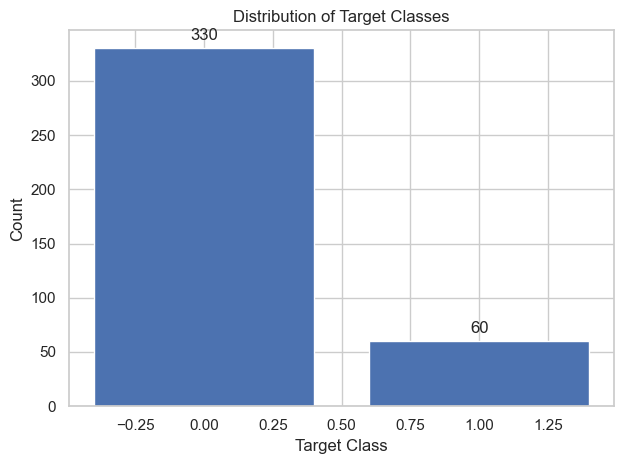

In [24]:
value_counts = df["diabetes"].value_counts()

# Create a bar plot
plt.bar(value_counts.index, value_counts.values)

# Add data annotations on the bars
for i, count in enumerate(value_counts.values):
    plt.text(i, count + 5, str(count), ha='center', va='bottom', fontsize=12)

# Add labels and title
plt.xlabel('Target Class')
plt.ylabel('Count')
plt.title('Distribution of Target Classes')

# Show the plot
plt.tight_layout()
plt.show()


In [15]:
df["gender"].value_counts()

female    228
male      162
Name: gender, dtype: int64

In [16]:
pd.crosstab(df.gender, df['gender'] ).style.background_gradient(cmap='RdPu')

gender,female,male
gender,,
female,228,0
male,0,162


Text(0.5, 0.85, 'Heatmap Plot')

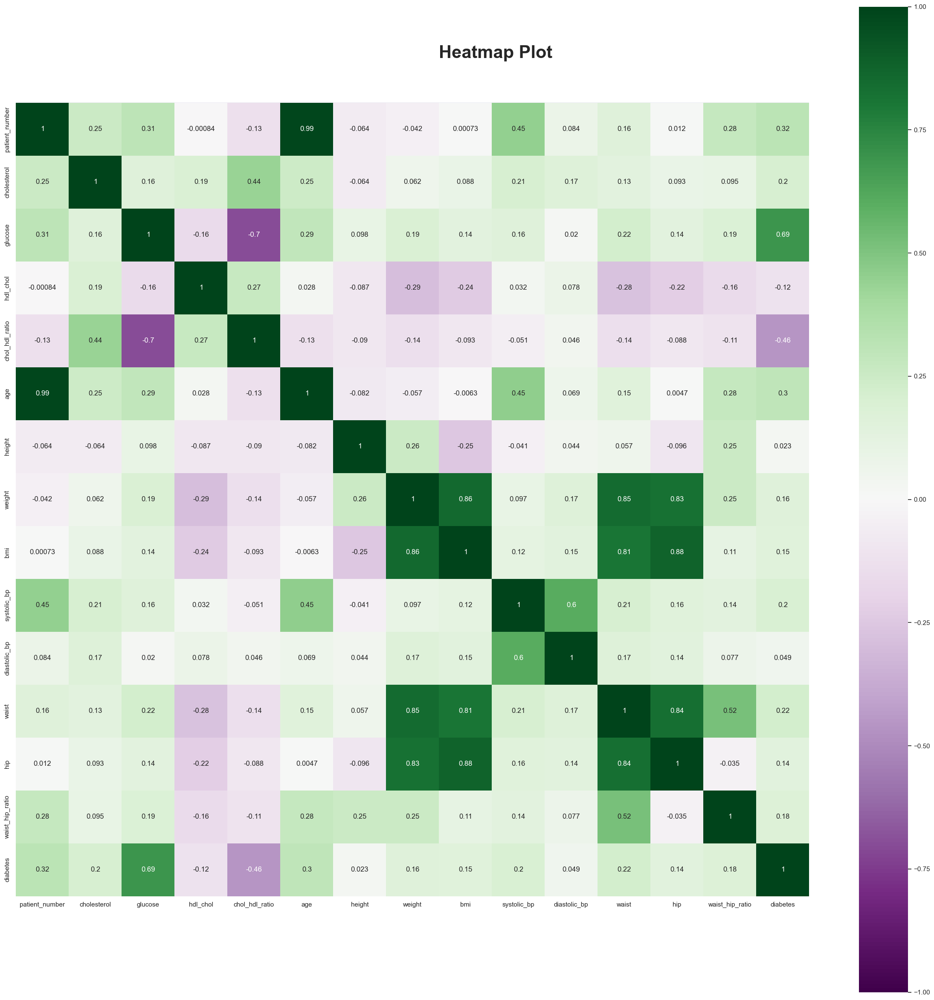

In [17]:
plt.figure(figsize=(30,30))
sns.heatmap(df.corr("pearson"),
            vmin=-1, vmax=1,
            cmap='PRGn',
            annot=True, 
            square=True);
plt.suptitle('Heatmap Plot',fontsize=30, fontweight='bold', y=0.85)

Women are more prone to coronary artery disease

In [18]:
pd.crosstab(df.gender, df.diabetes ).style.background_gradient(cmap='RdPu')

diabetes,0,1
gender,,
female,194,34
male,136,26


In [19]:
pd.crosstab(df.gender, df.diabetes, normalize = "columns" ).style.background_gradient(cmap='RdPu')

diabetes,0,1
gender,,
female,0.587879,0.566667
male,0.412121,0.433333


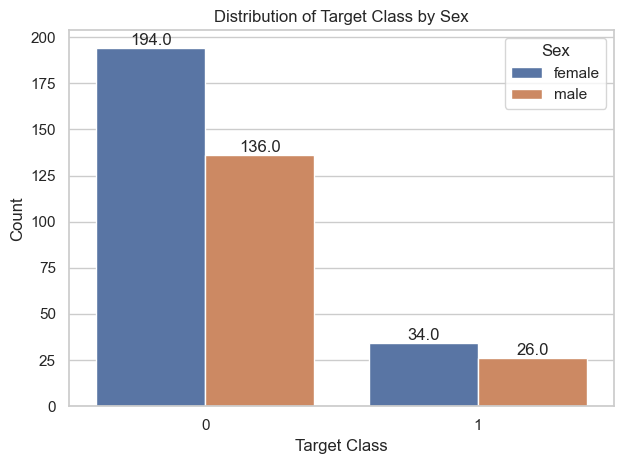

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


# Create a countplot using Seaborn
sns.set(style="whitegrid")
ax = sns.countplot(data=df, x="diabetes", hue="gender")

# Add data annotations on the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=12)

# Add labels and title
plt.xlabel('Target Class')
plt.ylabel('Count')
plt.title('Distribution of Target Class by Sex')
plt.legend(title='Sex')

# Show the plot
plt.tight_layout()
plt.show()


The risk of diabetes increases with age

In [23]:
pd.crosstab(df.age, df.diabetes, margins=True).style.background_gradient(cmap='Pastel2')

diabetes,0,1,All
age,,,
19,2,0,2
20,10,0,10
21,6,0,6
22,5,0,5
23,7,0,7
24,1,0,1
25,4,0,4
26,5,1,6
27,9,0,9


In [41]:
df_new = df['gender'] [df['gender'] =="male"]  =  1
df['gender'] [df['gender'] =="female"]  =  0
df

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes
0,1,193,77,49,2.51,19,0,61,119,22.5,118,70,32,38,0.842105,0
1,2,146,79,41,1.85,19,0,60,135,26.4,108,58,33,40,0.825000,0
2,3,217,75,54,2.89,20,0,67,187,29.3,110,72,40,45,0.888889,0
3,4,226,97,70,2.33,20,0,64,114,19.6,122,64,31,39,0.794872,0
4,5,164,91,67,1.80,20,0,70,141,20.2,122,86,32,39,0.820513,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,386,227,105,44,2.16,83,0,59,125,25.2,150,90,35,40,0.875000,0
386,387,226,279,52,0.81,84,0,60,192,37.5,144,88,41,48,0.854167,1
387,388,301,90,118,3.34,89,0,61,115,21.7,218,90,31,41,0.756098,0
388,389,232,184,114,1.26,91,0,61,127,24.0,170,82,35,38,0.921053,1


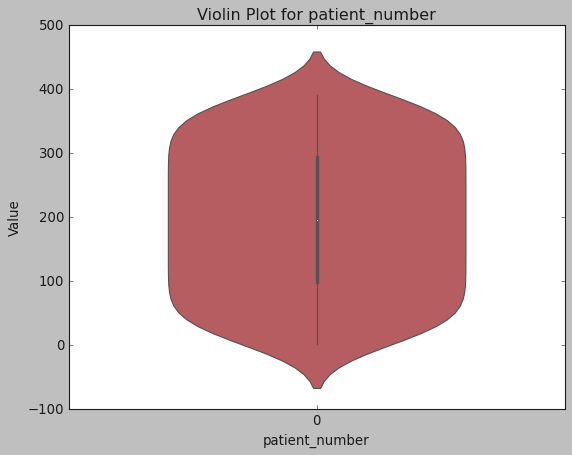

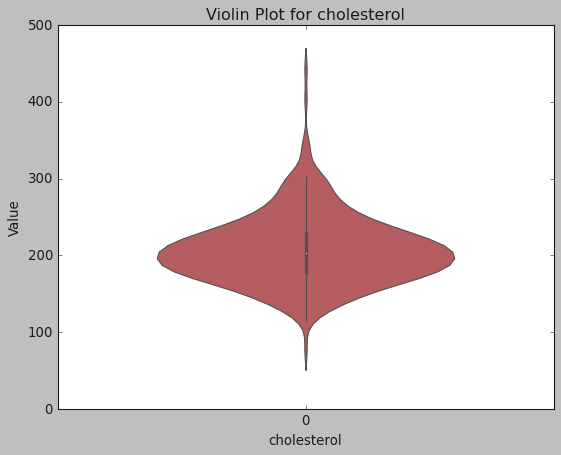

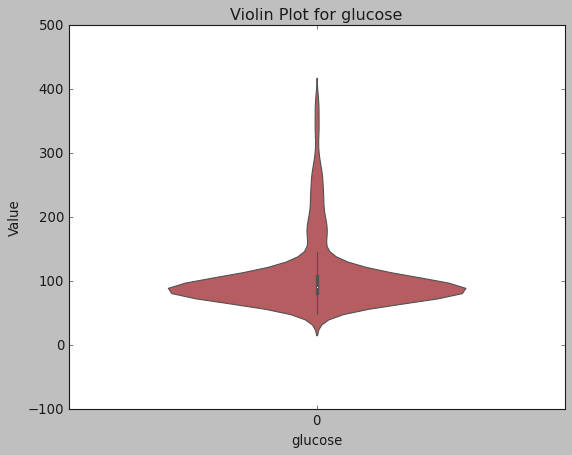

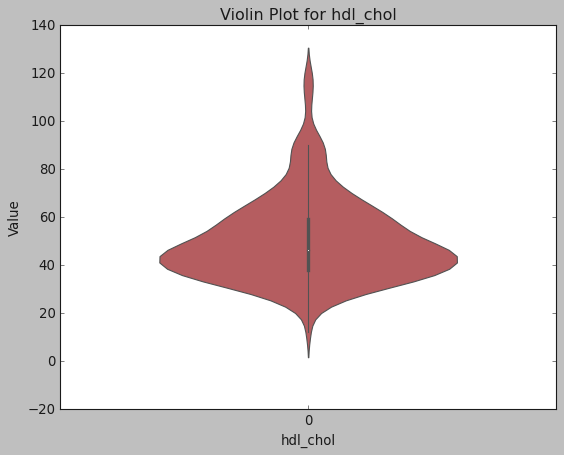

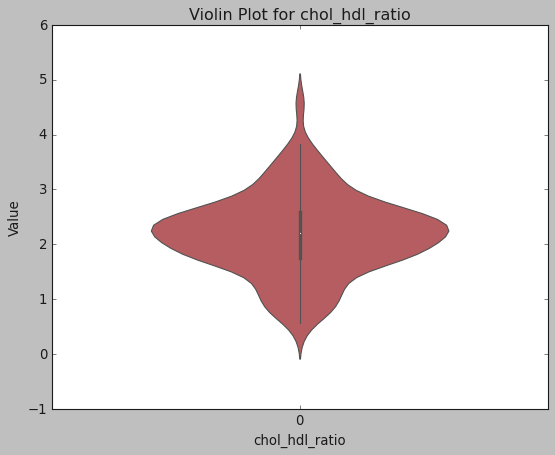

...

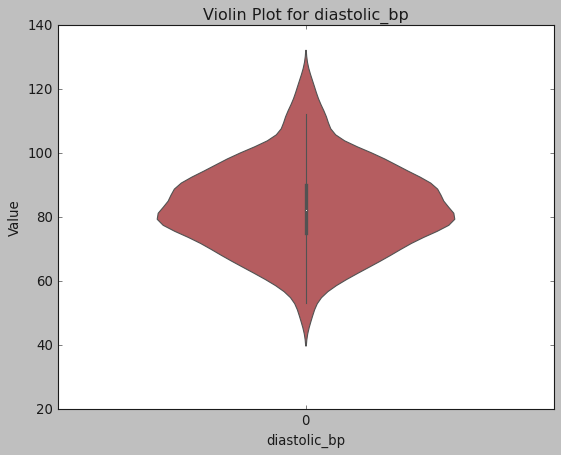

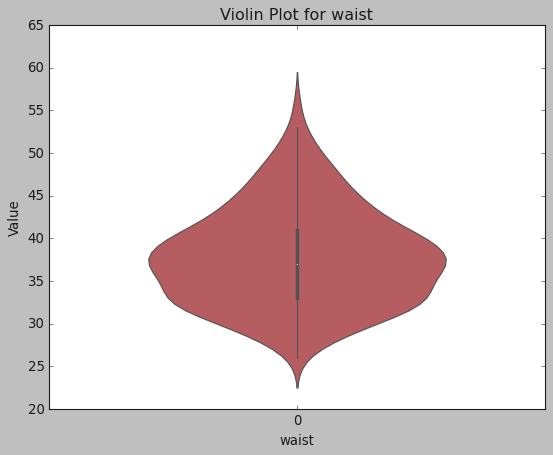

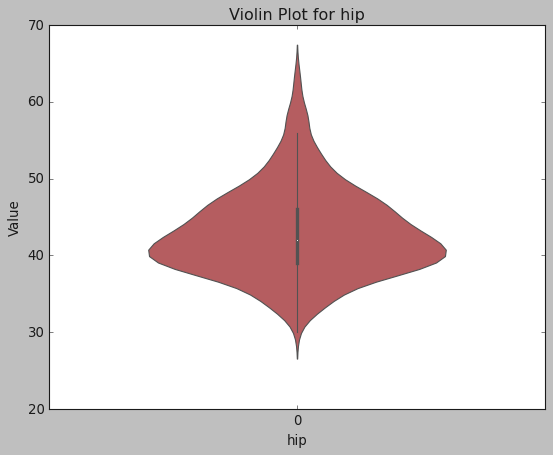

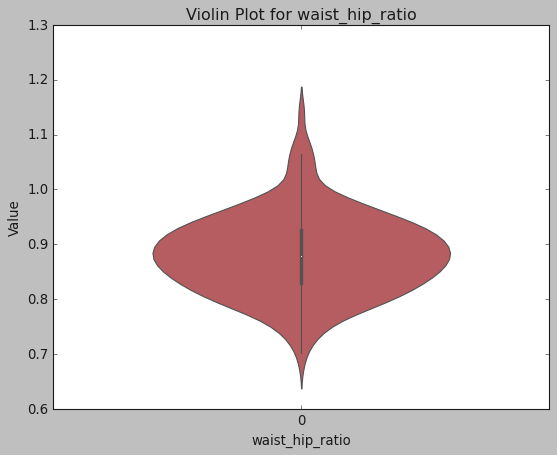

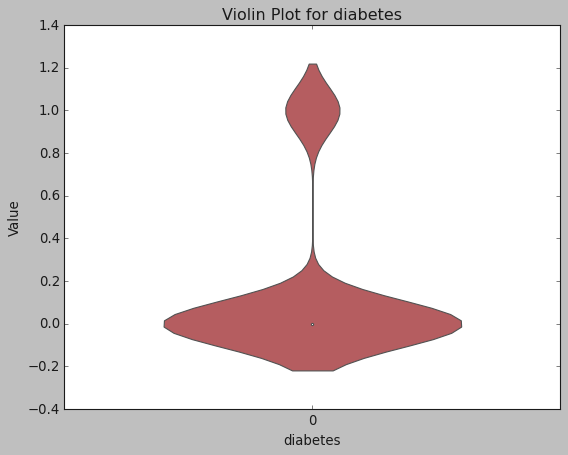

In [42]:
features = df.columns
for feature in features:
    sns.violinplot(data=df[feature], split=True, gridsize=50, width=0.6, color="r")
    plt.title(f'Violin Plot for {feature}')
    plt.xlabel(feature)
    plt.ylabel('Value')
    plt.show()

In [40]:
df

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes
0,1,193,77,49,2.51,19,0,61,119,22.5,118,70,32,38,0.842105,0
1,2,146,79,41,1.85,19,0,60,135,26.4,108,58,33,40,0.825000,0
2,3,217,75,54,2.89,20,0,67,187,29.3,110,72,40,45,0.888889,0
3,4,226,97,70,2.33,20,0,64,114,19.6,122,64,31,39,0.794872,0
4,5,164,91,67,1.80,20,0,70,141,20.2,122,86,32,39,0.820513,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,386,227,105,44,2.16,83,0,59,125,25.2,150,90,35,40,0.875000,0
386,387,226,279,52,0.81,84,0,60,192,37.5,144,88,41,48,0.854167,1
387,388,301,90,118,3.34,89,0,61,115,21.7,218,90,31,41,0.756098,0
388,389,232,184,114,1.26,91,0,61,127,24.0,170,82,35,38,0.921053,1


Step4: Install the package

In [26]:
# !pip install pandas-profiling

In [27]:
from pandas_profiling import profile_report
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

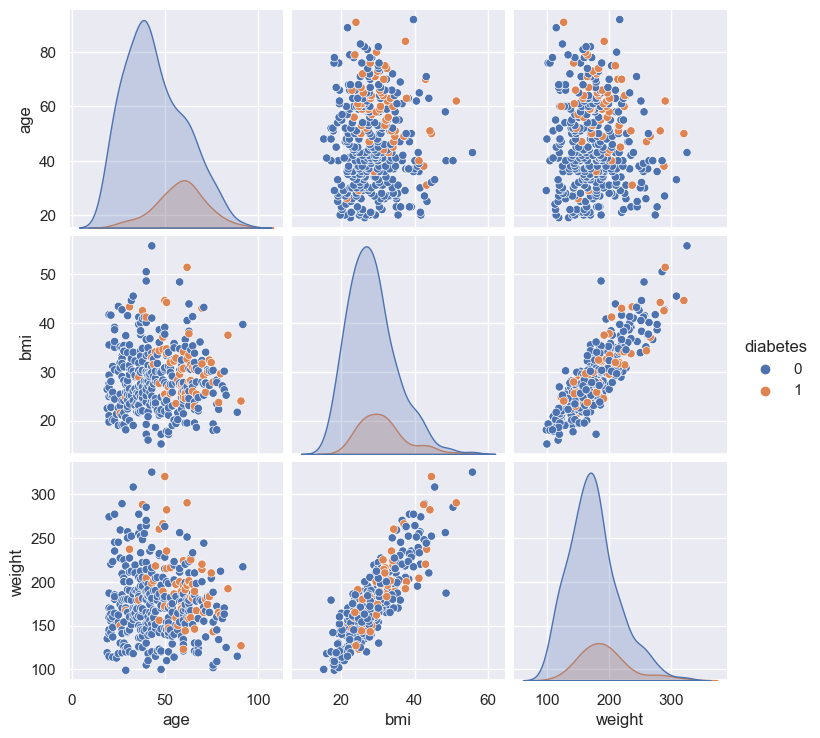

In [28]:
sns.pairplot(df, hue = 'diabetes', vars = ['age', 'bmi', 'weight'] )

<Axes: xlabel='diabetes', ylabel='age'>

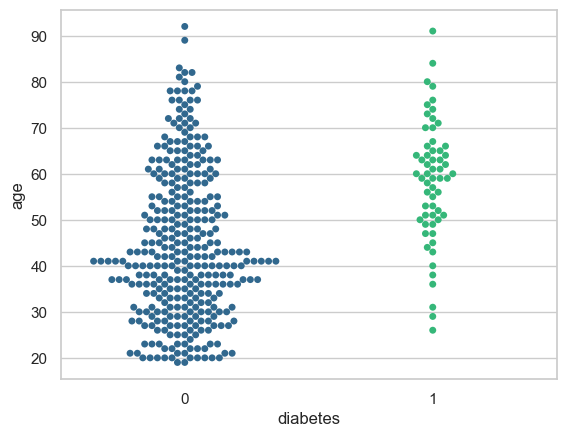

In [29]:
sns.set_style('whitegrid')

sns.swarmplot(x = "diabetes" , y = "age", data = df, palette = "viridis")

In [32]:
# !pip install cufflinks

In [33]:
import seaborn as sns
sns.set(rc={'figure.figsize':(12,8)})
plt.style.use('classic')
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go
import plotly.express as px
import cufflinks as cf

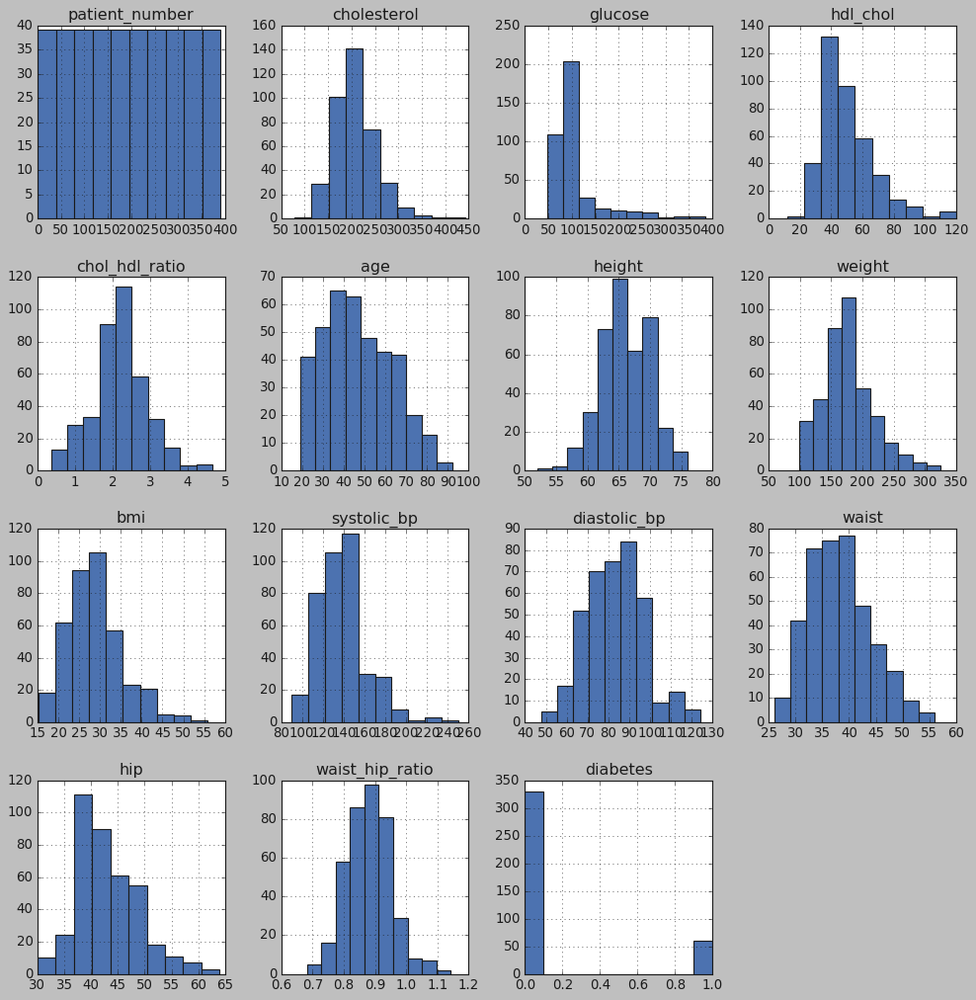

In [34]:
df.hist(figsize=(15,15))
plt.show()


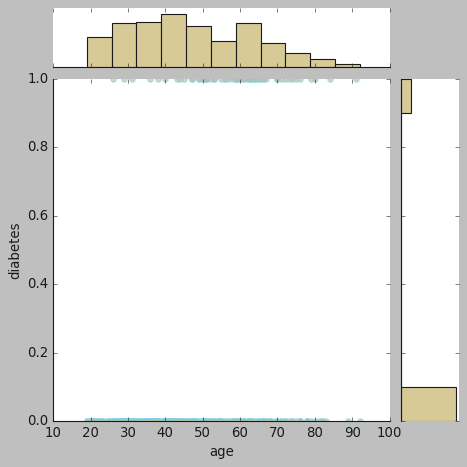

In [36]:
import seaborn as sns
sns.jointplot(x=df["age"], y = df["diabetes"],kind='scatter',
              s=20, color='y',alpha=0.6, edgecolor="skyblue", cmap="Blues",  linewidth=1.5)

In [37]:
# df_new = df['Cath'] [df['Cath'] =="Cad"]  =  1
# df['Cath'] [df['Cath'] =="Normal"]  =  0

df_new = df['gender'] [df['gender'] =="male"]  =  1
df['gender'] [df['gender'] =="female"]  =  0
df

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes
0,1,193,77,49,2.51,19,0,61,119,22.5,118,70,32,38,0.842105,0
1,2,146,79,41,1.85,19,0,60,135,26.4,108,58,33,40,0.825000,0
2,3,217,75,54,2.89,20,0,67,187,29.3,110,72,40,45,0.888889,0
3,4,226,97,70,2.33,20,0,64,114,19.6,122,64,31,39,0.794872,0
4,5,164,91,67,1.80,20,0,70,141,20.2,122,86,32,39,0.820513,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,386,227,105,44,2.16,83,0,59,125,25.2,150,90,35,40,0.875000,0
386,387,226,279,52,0.81,84,0,60,192,37.5,144,88,41,48,0.854167,1
387,388,301,90,118,3.34,89,0,61,115,21.7,218,90,31,41,0.756098,0
388,389,232,184,114,1.26,91,0,61,127,24.0,170,82,35,38,0.921053,1


<Axes: xlabel='weight', ylabel='diabetes'>

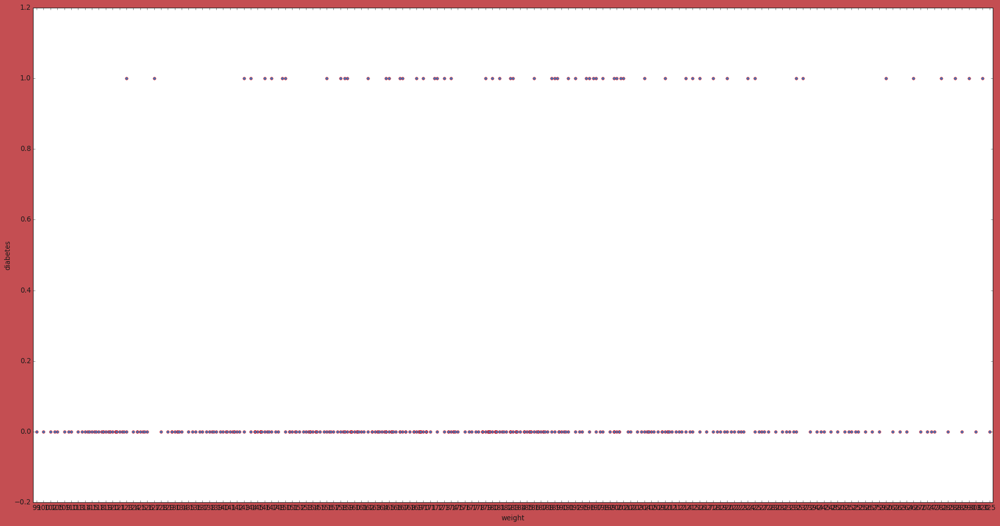

In [39]:
plt.figure(figsize=(30,15), facecolor = "r" )
sns.swarmplot(x=df['weight'], y = df['diabetes'],  size =5, linewidth=0.5, edgecolor='red')